In [1]:
import sys
import subprocess
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import seaborn as sns
import scipy.cluster
import sklearn.manifold
import sklearn.cluster
import plotly.io
import Cell_BLAST as cb
cb.config.RANDOM_SEED = 0
cb.config.N_JOBS = 4

sys.path.insert(0, "../../../Evaluation")
import utils

In [2]:
montoro_10x = cb.data.ExprDataSet.read_dataset("../../../Datasets/data/Montoro_10x/data.h5").normalize()
plasschaert = cb.data.ExprDataSet.read_dataset("../../../Datasets/data/Plasschaert/data.h5").normalize()
montoro_10x = utils.clean_dataset(montoro_10x, "cell_ontology_class")
plasschaert = utils.clean_dataset(plasschaert, "cell_ontology_class")

[  Info   ] Cleaning removed 0 cells.
[  Info   ] Cleaning removed 40 cells.


In [3]:
montoro_10x_no_ionocyte = cb.data.ExprDataSet.read_dataset(
    "../../../Datasets/data/Montoro_10x_no_ionocyte/data.h5"
).normalize()

### Build BLAST

In [4]:
montoro_10x_no_ionocyte_models = []
for i in range(2019, 2023):
    print("==== Model %d ====" % i)
    montoro_10x_no_ionocyte_models.append(cb.directi.fit_DIRECTi(
        montoro_10x_no_ionocyte, montoro_10x_no_ionocyte.uns["seurat_genes"],
        latent_dim=10, cat_dim=20, epoch=200, patience=30,
        random_seed=i, path="./Montoro_10x_no_ionocyte/model_%d" % i
    ))
montoro_10x_blast_no_ionocyte = cb.blast.BLAST(
    montoro_10x_no_ionocyte_models, montoro_10x_no_ionocyte, keep_exprs=True
).build_empirical()
montoro_10x_blast_no_ionocyte.save("./Montoro_10x_no_ionocyte/blast")

==== Model 2019 ====
[DIRECTi epoch 0] train=3.284, val=3.267, time elapsed=1.7s Best save...
[DIRECTi epoch 1] train=3.253, val=3.212, time elapsed=0.6s Best save...
[DIRECTi epoch 2] train=2.959, val=1.496, time elapsed=0.6s Best save...
[DIRECTi epoch 3] train=1.301, val=1.775, time elapsed=0.6s
[DIRECTi epoch 4] train=1.210, val=1.475, time elapsed=0.7s Best save...
[DIRECTi epoch 5] train=1.199, val=1.369, time elapsed=0.6s Best save...
[DIRECTi epoch 6] train=1.143, val=1.367, time elapsed=0.6s Best save...
[DIRECTi epoch 7] train=1.127, val=1.219, time elapsed=0.6s Best save...
[DIRECTi epoch 8] train=1.117, val=1.167, time elapsed=0.7s Best save...
[DIRECTi epoch 9] train=1.110, val=1.135, time elapsed=0.6s Best save...
[DIRECTi epoch 10] train=1.104, val=1.119, time elapsed=0.6s Best save...
[DIRECTi epoch 11] train=1.099, val=1.117, time elapsed=0.6s Best save...
[DIRECTi epoch 12] train=1.094, val=1.106, time elapsed=0.5s Best save...
[DIRECTi epoch 13] train=1.092, val=1.10

[DIRECTi epoch 123] train=0.979, val=0.998, time elapsed=0.5s
[DIRECTi epoch 124] train=0.981, val=0.997, time elapsed=0.5s
[DIRECTi epoch 125] train=0.979, val=0.998, time elapsed=0.5s
[DIRECTi epoch 126] train=0.981, val=0.995, time elapsed=0.6s Best save...
[DIRECTi epoch 127] train=0.979, val=0.998, time elapsed=0.6s
[DIRECTi epoch 128] train=0.979, val=0.997, time elapsed=0.6s
[DIRECTi epoch 129] train=0.979, val=1.014, time elapsed=0.6s
[DIRECTi epoch 130] train=0.980, val=0.997, time elapsed=0.6s
[DIRECTi epoch 131] train=0.979, val=1.001, time elapsed=0.6s
[DIRECTi epoch 132] train=0.979, val=0.997, time elapsed=0.6s
[DIRECTi epoch 133] train=0.979, val=0.998, time elapsed=0.6s
[DIRECTi epoch 134] train=0.978, val=1.000, time elapsed=0.6s
[DIRECTi epoch 135] train=0.977, val=0.998, time elapsed=0.6s
[DIRECTi epoch 136] train=0.979, val=0.998, time elapsed=0.6s
[DIRECTi epoch 137] train=0.980, val=0.997, time elapsed=0.6s
[DIRECTi epoch 138] train=0.978, val=0.998, time elapsed=

[DIRECTi epoch 75] train=0.994, val=1.019, time elapsed=0.5s
[DIRECTi epoch 76] train=0.993, val=0.996, time elapsed=0.5s
[DIRECTi epoch 77] train=0.995, val=0.998, time elapsed=0.6s
[DIRECTi epoch 78] train=0.992, val=0.994, time elapsed=0.6s Best save...
[DIRECTi epoch 79] train=0.993, val=0.994, time elapsed=0.6s
[DIRECTi epoch 80] train=0.993, val=0.995, time elapsed=0.6s
[DIRECTi epoch 81] train=0.990, val=0.996, time elapsed=0.6s
[DIRECTi epoch 82] train=0.991, val=0.994, time elapsed=0.6s
[DIRECTi epoch 83] train=0.990, val=0.998, time elapsed=0.6s
[DIRECTi epoch 84] train=0.990, val=0.993, time elapsed=0.6s Best save...
[DIRECTi epoch 85] train=0.991, val=0.995, time elapsed=0.6s
[DIRECTi epoch 86] train=0.988, val=0.991, time elapsed=0.6s Best save...
[DIRECTi epoch 87] train=0.989, val=0.997, time elapsed=0.6s
[DIRECTi epoch 88] train=0.989, val=0.993, time elapsed=0.6s
[DIRECTi epoch 89] train=0.988, val=0.992, time elapsed=0.6s
[DIRECTi epoch 90] train=0.988, val=0.991, tim

[DIRECTi epoch 22] train=1.043, val=1.041, time elapsed=0.6s Best save...
[DIRECTi epoch 23] train=1.040, val=1.050, time elapsed=0.6s
[DIRECTi epoch 24] train=1.038, val=1.060, time elapsed=0.5s
[DIRECTi epoch 25] train=1.037, val=1.043, time elapsed=0.5s
[DIRECTi epoch 26] train=1.036, val=1.037, time elapsed=0.6s Best save...
[DIRECTi epoch 27] train=1.034, val=1.035, time elapsed=0.6s Best save...
[DIRECTi epoch 28] train=1.033, val=1.034, time elapsed=0.6s Best save...
[DIRECTi epoch 29] train=1.031, val=1.029, time elapsed=0.6s Best save...
[DIRECTi epoch 30] train=1.028, val=1.031, time elapsed=0.6s
[DIRECTi epoch 31] train=1.028, val=1.036, time elapsed=0.6s
[DIRECTi epoch 32] train=1.028, val=1.030, time elapsed=0.6s
[DIRECTi epoch 33] train=1.025, val=1.028, time elapsed=0.6s Best save...
[DIRECTi epoch 34] train=1.024, val=1.038, time elapsed=0.6s
[DIRECTi epoch 35] train=1.022, val=1.039, time elapsed=0.6s
[DIRECTi epoch 36] train=1.020, val=1.036, time elapsed=0.6s
[DIRECT

[DIRECTi epoch 149] train=0.980, val=0.991, time elapsed=0.6s
Restoring best model...
INFO:tensorflow:Restoring parameters from ./Montoro_10x_no_ionocyte/model_2021/checkpoint-119
==== Model 2022 ====
[DIRECTi epoch 0] train=3.280, val=3.300, time elapsed=1.4s Best save...
[DIRECTi epoch 1] train=3.249, val=3.243, time elapsed=0.6s Best save...
[DIRECTi epoch 2] train=2.862, val=1.452, time elapsed=0.6s Best save...
[DIRECTi epoch 3] train=1.260, val=2.208, time elapsed=0.6s
[DIRECTi epoch 4] train=1.209, val=1.584, time elapsed=0.6s
[DIRECTi epoch 5] train=1.173, val=1.635, time elapsed=0.6s
[DIRECTi epoch 6] train=1.133, val=1.224, time elapsed=0.6s Best save...
[DIRECTi epoch 7] train=1.126, val=1.183, time elapsed=0.6s Best save...
[DIRECTi epoch 8] train=1.118, val=1.154, time elapsed=0.6s Best save...
[DIRECTi epoch 9] train=1.112, val=1.146, time elapsed=0.6s Best save...
[DIRECTi epoch 10] train=1.105, val=1.150, time elapsed=0.6s
[DIRECTi epoch 11] train=1.099, val=1.128, time

[DIRECTi epoch 121] train=0.982, val=1.005, time elapsed=0.6s
[DIRECTi epoch 122] train=0.979, val=1.005, time elapsed=0.6s
[DIRECTi epoch 123] train=0.980, val=1.007, time elapsed=0.6s
[DIRECTi epoch 124] train=0.980, val=1.006, time elapsed=0.7s
[DIRECTi epoch 125] train=0.980, val=1.008, time elapsed=0.6s
[DIRECTi epoch 126] train=0.980, val=1.004, time elapsed=0.6s
[DIRECTi epoch 127] train=0.980, val=1.006, time elapsed=0.5s
[DIRECTi epoch 128] train=0.981, val=1.005, time elapsed=0.5s
[DIRECTi epoch 129] train=0.980, val=1.005, time elapsed=0.6s
[DIRECTi epoch 130] train=0.980, val=1.008, time elapsed=0.6s
[DIRECTi epoch 131] train=0.979, val=1.006, time elapsed=0.6s
[DIRECTi epoch 132] train=0.979, val=1.008, time elapsed=0.6s
[DIRECTi epoch 133] train=0.980, val=1.004, time elapsed=0.6s
[DIRECTi epoch 134] train=0.981, val=1.002, time elapsed=0.6s Best save...
[DIRECTi epoch 135] train=0.979, val=1.007, time elapsed=0.6s
[DIRECTi epoch 136] train=0.979, val=1.007, time elapsed=

In [5]:
hits = montoro_10x_blast_no_ionocyte.query(plasschaert)

[  Info   ] Projecting to latent space...
[ Warning ] 30 out of 372 variables are not found, will be set to zero![ Warning ] 30 out of 372 variables are not found, will be set to zero!

[ Warning ] 30 out of 372 variables are not found, will be set to zero!
[ Warning ] 30 out of 372 variables are not found, will be set to zero!
[ Warning ] 30 out of 372 variables are not found, will be set to zero!
[ Warning ] 30 out of 372 variables are not found, will be set to zero!
[ Warning ] 30 out of 372 variables are not found, will be set to zero!
[ Warning ] 30 out of 372 variables are not found, will be set to zero!
[  Info   ] Doing nearest neighbor search...
[  Info   ] Merging hits across models...
[  Info   ] Computing posterior distribution distances...
[  Info   ] Computing empirical p-values...


In [6]:
plasschaert.obs["pred"] = hits.reconcile_models().filter("pval", 0.1).annotate(
    "cell_ontology_class", min_hits=6
)["cell_ontology_class"]
cb.data.write_hybrid_path(plasschaert.obs["pred"].values, "./cb_prediction.h5//prediction")

/home/caozj/Software/anaconda2/envs/cb-gpu/lib/python3.6/site-packages/scipy/stats/stats.py:313: RuntimeWarning:

divide by zero encountered in log



In [7]:
fig = cb.blast.sankey(
    plasschaert.obs["cell_ontology_class"], plasschaert.obs["pred"],
    title="Plasschaert to Montoro_10x_no_ionocyte",
    width=680, height=600, tint_cutoff=5
)
plotly.io.write_image(fig, "./cb_sankey.pdf")

In [8]:
ionocyte_mask = plasschaert.obs["cell_ontology_class"] != "ionocyte"
correct_mask = (plasschaert.obs["pred"] == plasschaert.obs["cell_ontology_class"])[ionocyte_mask]
correct_mask.sum() / correct_mask.size

0.9589476727377855

Let's take a closer look at the ionocytes not rejected.

In [9]:
plasschaert.obs["true->pred"] = plasschaert.obs["cell_ontology_class"] + "->" + plasschaert.obs["pred"]

In [10]:
plasschaert_ionocyte = plasschaert[
    plasschaert.obs["cell_ontology_class"] == "ionocyte", :]

In [11]:
montoro_10x_ionocyte = montoro_10x[
    montoro_10x.obs["cell_ontology_class"] == "ionocyte", :]
montoro_10x_ionocyte.obs["true->pred"] = "<ionocyte>"

In [12]:
random_state = np.random.RandomState(0)

montoro_10x_club = montoro_10x[
    montoro_10x.obs["cell_ontology_class"] == "club cell", :]
montoro_10x_club = montoro_10x_club[
    random_state.choice(np.arange(montoro_10x_club.shape[0]), 50, replace=False), :]
montoro_10x_club.obs["true->pred"] = "<club cell>"

montoro_10x_pnec = montoro_10x[
    montoro_10x.obs["cell_ontology_class"] == "lung neuroendocrine cell", :]
montoro_10x_pnec = montoro_10x_pnec[
    random_state.choice(np.arange(montoro_10x_pnec.shape[0]), 50, replace=False), :]
montoro_10x_pnec.obs["true->pred"] = "<lung neuroendocrine cell>"

In [13]:
combined_dataset = cb.data.ExprDataSet.merge_datasets(dict(
    plasschaert_ionocyte=plasschaert_ionocyte,
    montoro_10x_ionocyte=montoro_10x_ionocyte,
    montoro_10x_club=montoro_10x_club,
    montoro_10x_pnec=montoro_10x_pnec
))

[ Warning ] 2693 out of 30898 variables are not found, will be set to zero!
[ Warning ] 12510 out of 30898 variables are not found, will be set to zero!
[ Warning ] 12510 out of 30898 variables are not found, will be set to zero!
[ Warning ] 12510 out of 30898 variables are not found, will be set to zero!
[  Info   ] Merging uns slots...
[  Info   ] Merging var data frame...
[  Info   ] Merging obs data frame...
[  Info   ] Merging expression matrix...


/home/caozj/Software/anaconda2/envs/cb-gpu/lib/python3.6/site-packages/Cell_BLAST/data.py:579: FutureWarning:

Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.




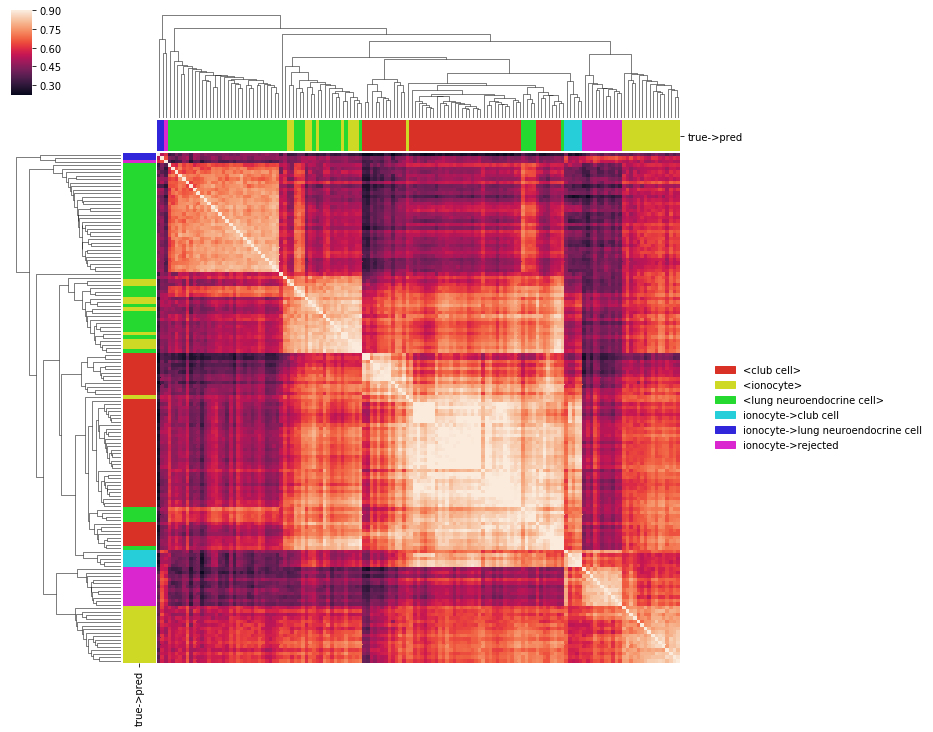

In [14]:
plot = combined_dataset.obs_correlation_heatmap(
    "true->pred", used_vars=montoro_10x_blast_no_ionocyte.models[0].genes,
    cluster_method="average", width=12, height=12, vmax=0.9
)
plot.fig.savefig("correlation_heatmap.pdf", bbox_inches="tight")

In [15]:
combined_dataset = combined_dataset[np.argsort(combined_dataset.obs["true->pred"]), :]

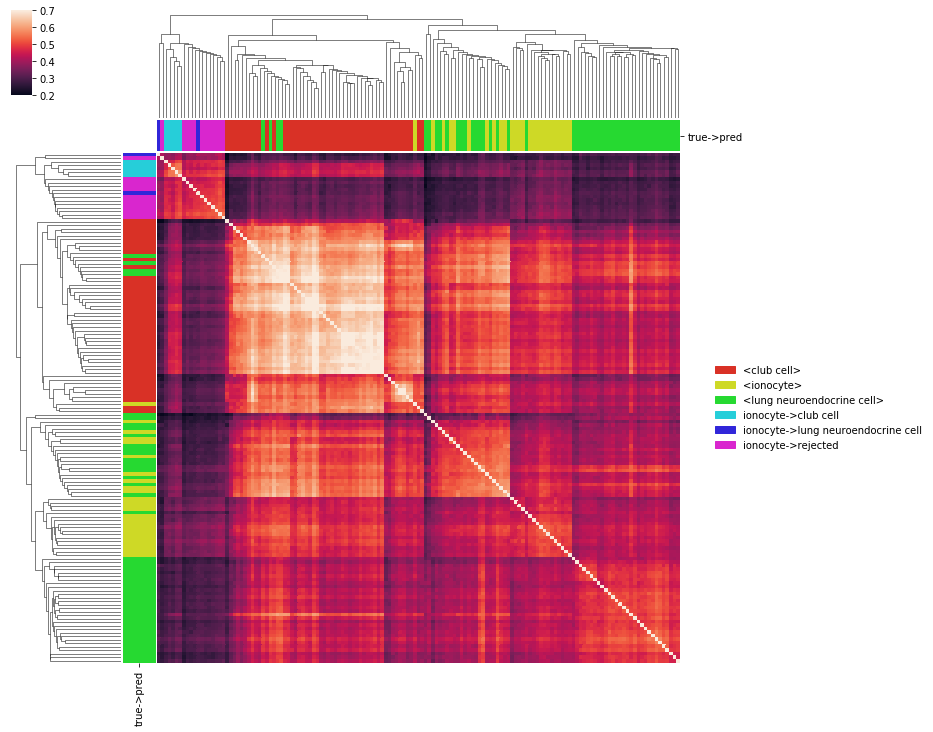

In [16]:
plot = combined_dataset.obs_correlation_heatmap(
    "true->pred", cluster_method="complete", width=12, height=12, vmax=0.7)
plot.fig.savefig("correlation_heatmap_all_genes.pdf", bbox_inches="tight")

Club markers

In [17]:
montoro_markers = montoro_10x.fast_markers("cell_ontology_class")

/home/caozj/Software/anaconda2/envs/cb-gpu/lib/python3.6/site-packages/scipy/stats/_distn_infrastructure.py:879: RuntimeWarning:

invalid value encountered in greater

/home/caozj/Software/anaconda2/envs/cb-gpu/lib/python3.6/site-packages/scipy/stats/_distn_infrastructure.py:879: RuntimeWarning:

invalid value encountered in less

/home/caozj/Software/anaconda2/envs/cb-gpu/lib/python3.6/site-packages/scipy/stats/_distn_infrastructure.py:1821: RuntimeWarning:

invalid value encountered in less_equal

/home/caozj/Software/anaconda2/envs/cb-gpu/lib/python3.6/site-packages/scipy/stats/_distn_infrastructure.py:1738: RuntimeWarning:

invalid value encountered in greater_equal

/home/caozj/Software/anaconda2/envs/cb-gpu/lib/python3.6/site-packages/numpy/core/_methods.py:32: RuntimeWarning:

invalid value encountered in reduce



In [18]:
montoro_markers["club cell"].head(n=20)

,pct_1,pct_2,logfc,stat,z,pval,padj
Ltf,0.971,0.458,2.370318,10962088.5,60.772116,0.0,0.0
Cyp2a5,0.983,0.420,1.701606,10906131.5,60.355448,0.0,0.0
Pglyrp1,0.997,0.696,1.446300,11025447.0,60.339108,0.0,0.0
Scgb1a1,1.000,0.995,3.592849,11027101.0,60.131503,0.0,0.0
Pigr,0.765,0.087,1.185130,10031932.5,57.816022,0.0,0.0
Lyz2,0.990,0.749,2.466390,10657096.5,55.875438,0.0,0.0
Nupr1,0.988,0.413,1.262278,10504279.5,55.498257,0.0,0.0
Sftpd,0.904,0.351,1.473676,10305217.5,54.123554,0.0,0.0
Msln,0.901,0.306,1.391757,10163813.0,52.939847,0.0,0.0
Cxcl17,0.934,0.356,1.181509,10119746.0,51.584215,0.0,0.0


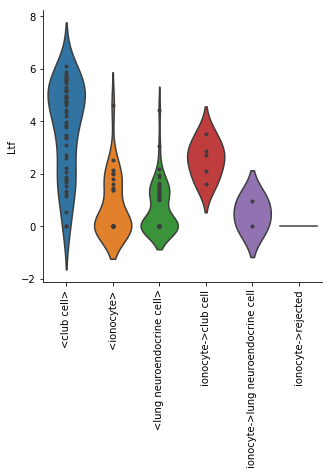

In [19]:
ax = combined_dataset.violin("true->pred", "Ltf", width=5, height=5)
_ = plt.xticks(rotation=90)
_ = plt.xlabel(None)
ax.get_figure().savefig("./violin_Ltf.pdf", bbox_inches="tight")

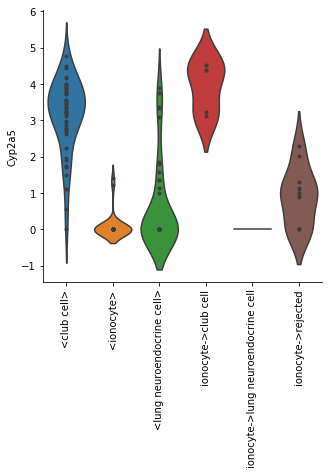

In [20]:
ax = combined_dataset.violin("true->pred", "Cyp2a5", width=5, height=5)
_ = plt.xticks(rotation=90)
_ = plt.xlabel(None)
ax.get_figure().savefig("./violin_Cyp2a5.pdf", bbox_inches="tight")

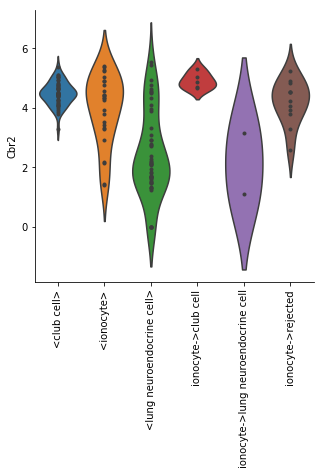

In [21]:
ax = combined_dataset.violin("true->pred", "Cbr2", width=5, height=5)
_ = plt.xticks(rotation=90)
_ = plt.xlabel(None)
ax.get_figure().savefig("./violin_Cbr2.pdf", bbox_inches="tight")

Ionocyte markers

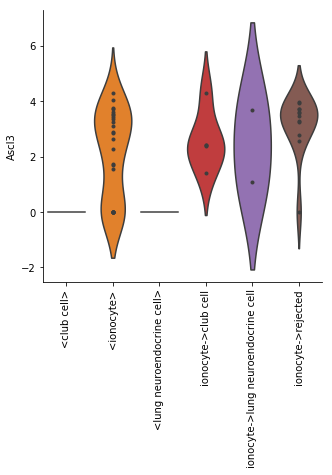

In [22]:
ax = combined_dataset.violin("true->pred", "Ascl3", width=5, height=5)
_ = plt.xticks(rotation=90)
_ = plt.xlabel(None)
ax.get_figure().savefig("./violin_Ascl3.pdf", bbox_inches="tight")

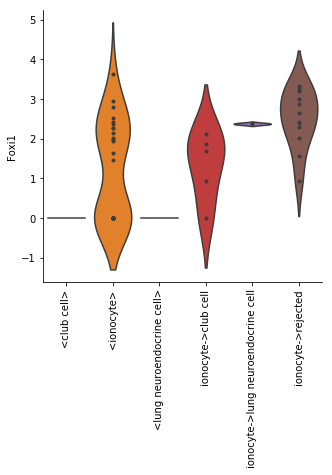

In [23]:
ax = combined_dataset.violin("true->pred", "Foxi1", width=5, height=5)
_ = plt.xticks(rotation=90)
_ = plt.xlabel(None)
ax.get_figure().savefig("./violin_Foxi1.pdf", bbox_inches="tight")

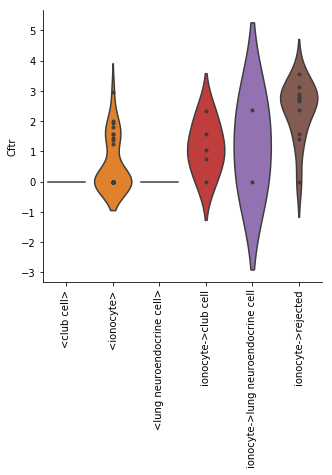

In [24]:
ax = combined_dataset.violin("true->pred", "Cftr", width=5, height=5)
_ = plt.xticks(rotation=90)
_ = plt.xlabel(None)
ax.get_figure().savefig("./violin_Cftr.pdf", bbox_inches="tight")

Let's take a closer look at the ionocytes rejected.

In [25]:
plasschaert_unassigned = plasschaert[
    np.in1d(plasschaert.obs["pred"], ("rejected", )),
    montoro_10x_blast_no_ionocyte.models[0].genes
]
unassigned_pval = [hits.reconcile_models().pval[i] for i in np.where(
    np.in1d(plasschaert.obs["pred"], ("rejected", ))
)[0]]
plasschaert_unassigned.obs["Average p-value"] = \
    np.array([scipy.stats.gmean(item, axis=None) for item in unassigned_pval])

[ Warning ] 30 out of 372 variables are not found, will be set to zero!


/home/caozj/Software/anaconda2/envs/cb-gpu/lib/python3.6/site-packages/scipy/stats/stats.py:313: RuntimeWarning:

divide by zero encountered in log



[  Info   ] Computing tSNE...


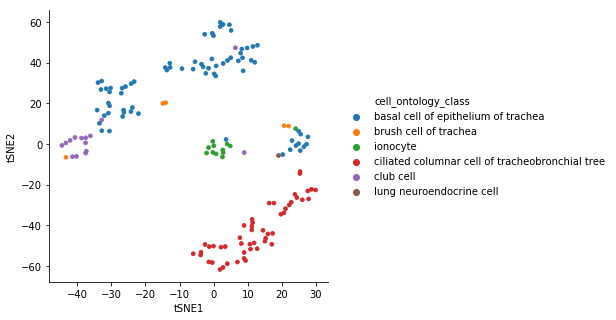

In [26]:
plasschaert_unassigned.latent = montoro_10x_blast_no_ionocyte.models[0].inference(plasschaert_unassigned)
plot = plasschaert_unassigned.visualize_latent(
    "cell_ontology_class", dr_kws=dict(perplexity=5),
    size=15, width=5, height=5, reuse=False
)
plot.get_figure().savefig("./cb_unassigned_cl_tsne.pdf", bbox_inches="tight")

In [27]:
sim_mat = np.exp(-1 * scipy.spatial.distance.squareform(
    scipy.spatial.distance.pdist(plasschaert_unassigned.obs.loc[:, ["tSNE1", "tSNE2"]])
))
plasschaert_unassigned.obs["cluster"] = np.vectorize(
    lambda x: "cluster_%d" % x
)(sklearn.cluster.spectral_clustering(sim_mat, n_clusters=3, random_state=0))

[  Info   ] Using cached tSNE...


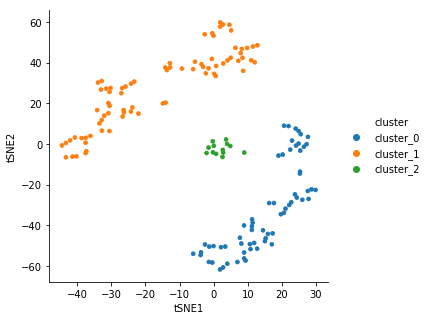

In [28]:
plot = plasschaert_unassigned.visualize_latent("cluster", size=15, sort=True, width=5, height=5)
plot.get_figure().savefig("./cb_unassigned_cluster_tsne.pdf", bbox_inches="tight")

[  Info   ] Using cached tSNE...


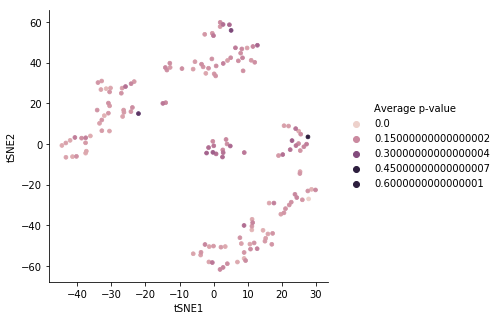

In [29]:
plot = plasschaert_unassigned.visualize_latent("Average p-value", size=15, sort=True, width=5, height=5)
plot.get_figure().savefig("./cb_unassigned_pval_tsne.pdf", bbox_inches="tight")

/home/caozj/Software/anaconda2/envs/cb-gpu/lib/python3.6/site-packages/scipy/stats/stats.py:1713: FutureWarning:

Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.



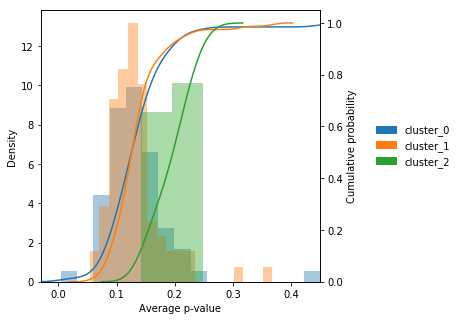

In [30]:
fig, ax = plt.subplots(figsize=(5, 5))
ax2 = ax.twinx()
legend_handles = []
for i in range(np.unique(plasschaert_unassigned.obs["cluster"]).size):
    ax = sns.distplot(plasschaert_unassigned.obs.loc[
        plasschaert_unassigned.obs["cluster"] == "cluster_%d" % i, "Average p-value"
    ], color=sns.color_palette()[i], kde=False, hist_kws=dict(density=True), ax=ax)
    ax2 = sns.distplot(plasschaert_unassigned.obs.loc[
        plasschaert_unassigned.obs["cluster"] == "cluster_%d" % i, "Average p-value"
    ], color=sns.color_palette()[i], hist=False, kde_kws=dict(cumulative=True), ax=ax2)
    legend_handles.append(mpatches.Patch(color=sns.color_palette()[i], label="cluster_%d" % i))
_ = plt.legend(handles=legend_handles, frameon=False, bbox_to_anchor=(1.17, 0.5), loc="center left")
_ = ax.set(xlabel="Average p-value", ylabel="Density")
_ = ax2.set(ylabel="Cumulative probability")
plt.xlim(-0.03, 0.45)
fig.savefig("./cb_unassigned_pval_distribution.pdf", bbox_inches="tight")

---

# scmap

In [31]:
p = subprocess.Popen([
    "./run_scmap.R",
    "-r", "../../Datasets/data/Montoro_10x_no_ionocyte/data.h5", "-n", "Montoro_10x_no_ionocyte",
    "-q", "../../Datasets/data/Plasschaert/data.h5",
    "-o", "../../Notebooks/Case/Trachea/scmap_no_ionocyte.h5",
    "-g", "scmap_genes", "-s", "0",
    "--cluster-col", "cell_ontology_class", "--clean", "cell_ontology_class"
], cwd="../../../Evaluation/scmap", stdout=subprocess.PIPE, stderr=subprocess.PIPE)
(output, err) = p.communicate()
exit_code = p.wait()
print(output.decode())
print(err.decode())

Reading reference data...
Processing "../../Datasets/data/Montoro_10x_no_ionocyte/data.h5"...
[1]  456 7167
Reading query data...
Performing scmap-cell...
[1] "Time: 6.542948 ms/cell"
Saving results...
Removing previous file...

Creating a generic function for ‘toJSON’ from package ‘jsonlite’ in package ‘googleVis’
Cleaning removed 0 cells.
Parameter M was not provided, will use M = n_features / 10 (if n_features <= 1000), where n_features is the number of selected features, and M = 100 otherwise.
Parameter k was not provided, will use k = sqrt(number_of_cells)
Cleaning removed 40 cells.
Done!



In [32]:
plasschaert.obs["scmap_pred"] = cb.data.read_hybrid_path(
    "./scmap_no_ionocyte.h5//prediction/0.5")
plasschaert.obs["scmap similarity"] = scipy.stats.gmean(cb.data.read_hybrid_path(
    "./scmap_no_ionocyte.h5//scmap_cell/nn/Montoro_10x_no_ionocyte/similarities"
), axis=1)

In [33]:
ionocyte_mask = plasschaert.obs["cell_ontology_class"] != "ionocyte"
correct_mask = (plasschaert.obs["scmap_pred"] == plasschaert.obs["cell_ontology_class"])[ionocyte_mask]
correct_mask.sum() / correct_mask.size

0.9285920786354438

In [34]:
fig = cb.blast.sankey(
    plasschaert.obs["cell_ontology_class"], plasschaert.obs["scmap_pred"],
    title="Plasschaert to Montoro_10x_no_ionocyte (scmap)",
    width=680, height=600, tint_cutoff=5
)
plotly.io.write_image(fig, "./scmap_sankey.pdf")

In [35]:
plasschaert_unassigned = plasschaert[
    plasschaert.obs["scmap_pred"] == "unassigned",
    plasschaert.uns["scmap_genes"]
]

In [36]:
plasschaert_unassigned_tsne = sklearn.manifold.TSNE(
    perplexity=15, metric="correlation", random_state=0
).fit_transform(plasschaert_unassigned.exprs.log1p().toarray())
plasschaert_unassigned.obs["tSNE1"] = plasschaert_unassigned_tsne[:, 0]
plasschaert_unassigned.obs["tSNE2"] = plasschaert_unassigned_tsne[:, 1]

[  Info   ] Using cached tSNE...


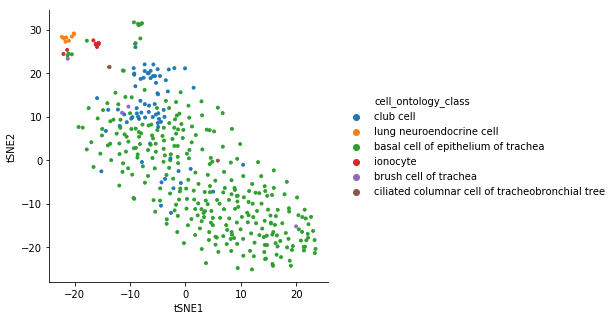

In [37]:
plot = plasschaert_unassigned.visualize_latent("cell_ontology_class", size=10, width=5, height=5)
plot.get_figure().savefig("./scmap_unassigned_cl_tsne.pdf", bbox_inches="tight")

In [38]:
sim_mat = np.exp(-1 * scipy.spatial.distance.squareform(
    scipy.spatial.distance.pdist(plasschaert_unassigned.obs.loc[:, ["tSNE1", "tSNE2"]])
))
plasschaert_unassigned.obs["cluster"] = np.vectorize(
    lambda x: "cluster_%d" % x
)(sklearn.cluster.spectral_clustering(sim_mat, n_clusters=7, random_state=0))

[  Info   ] Using cached tSNE...


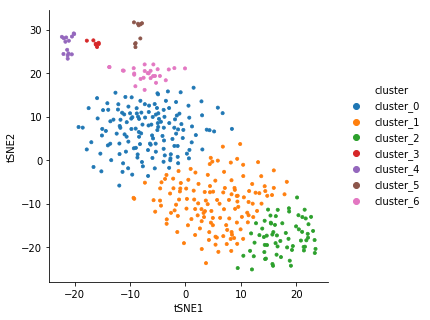

In [39]:
plot = plasschaert_unassigned.visualize_latent("cluster", size=10, sort=True, width=5, height=5)
plot.get_figure().savefig("./scmap_unassigned_cluster_tsne.pdf", bbox_inches="tight")

[  Info   ] Using cached tSNE...


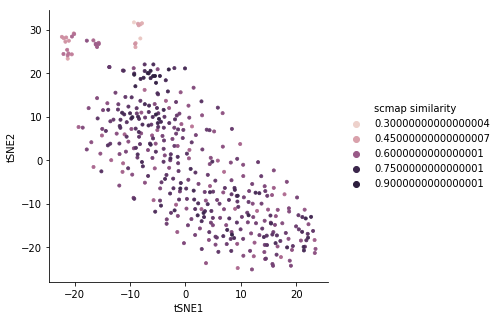

In [40]:
ax = plasschaert_unassigned.visualize_latent("scmap similarity", size=10, sort=True, width=5, height=5)
ax.get_figure().savefig("./scmap_unassigned_sim_tsne.pdf", bbox_inches="tight")

/home/caozj/Software/anaconda2/envs/cb-gpu/lib/python3.6/site-packages/scipy/stats/stats.py:1713: FutureWarning:

Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.



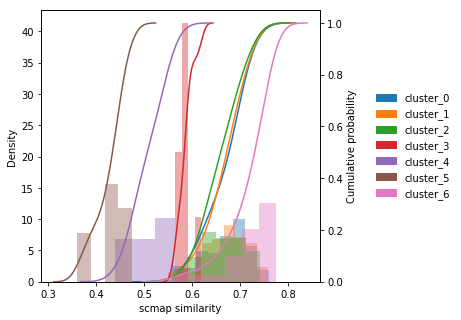

In [41]:
fig, ax = plt.subplots(figsize=(5, 5))
ax2 = ax.twinx()
legend_handles = []
for i in range(np.unique(plasschaert_unassigned.obs["cluster"]).size):
    ax = sns.distplot(plasschaert_unassigned.obs.loc[
        plasschaert_unassigned.obs["cluster"] == "cluster_%d" % i, "scmap similarity"
    ], color=sns.color_palette()[i], kde=False, hist_kws=dict(density=True), ax=ax)
    ax2 = sns.distplot(plasschaert_unassigned.obs.loc[
        plasschaert_unassigned.obs["cluster"] == "cluster_%d" % i, "scmap similarity"
    ], color=sns.color_palette()[i], hist=False, kde_kws=dict(cumulative=True), ax=ax2)
    legend_handles.append(mpatches.Patch(color=sns.color_palette()[i], label="cluster_%d" % i))
_ = plt.legend(handles=legend_handles, frameon=False, bbox_to_anchor=(1.17, 0.5), loc="center left")
_ = ax.set(xlabel="scmap similarity", ylabel="Density")
_ = ax2.set(ylabel="Cumulative probability")
fig.savefig("./scmap_unassigned_sim_distribution.pdf", bbox_inches="tight")